# **TRAFFIC SIGNAL IMAGE CLASSIFICATION**

# **1. Load Data**

In [ ]:
from google.colab import drive

In [ ]:
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
! ls gdrive/MyDrive

 1613900034029.jpg			       Part1.gdoc
'1811218 (1).jpg'			      'python file for ameed'
 1811218.jpg				       traffic.zip
 cds_i_2020_english_21.pdf		      'UK Student Declaration Form 2023.DOCX'
 cds_ii_2020_english_16.pdf		      'Untitled document.gdoc'
 cds_ii_2020_english_gk_paper_56.pdf	      'Untitled spreadsheet.gsheet'
'certificate (3).pdf'			       VID_20210129_085220.mp4
 Classroom				       VID_20210211_173228.mp4
'Colab Notebooks'			       yadhu.gsheet
'Contact Information (1).gform'		      ' '\''YADHU KRISHNA P R (1811218) HRE PPT'
'Contact Information.gform'		      'YADHU KRISHNA P R (1).pdf'
'Contact Information (Responses) (1).gsheet'  'YADHU KRISHNA P R.pdf'
'Contact Information (Responses).gsheet'      'Yadhu'\''s Resume (1).pdf'
'Copy of CS50 Pixel Art.gsheet'		      'Yadhu'\''s Resume (3).pdf'
 IMG-20210122-WA0005.jpg		      "Yadhu's Resume.pdf"
'MINI PROJECT ATTENDANCE 1 .gsheet'	       yadhu.xlsx


In [ ]:
!unzip gdrive/MyDrive/traffic.zip

Archive:  gdrive/MyDrive/traffic.zip
replace traffic/Red/000803.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: traffic/Red/000803.jpg  
  inflating: traffic/Red/000806.jpg  
  inflating: traffic/Red/000856.jpg  
  inflating: traffic/Red/000865.jpg  
  inflating: traffic/Red/000867.jpg  
  inflating: traffic/Red/000873.jpg  
  inflating: traffic/Red/000878.jpg  
  inflating: traffic/Red/000879.jpg  
  inflating: traffic/Red/000882.jpg  
  inflating: traffic/Red/000892.jpg  
  inflating: traffic/Red/000896.jpg  
  inflating: traffic/Red/000903.jpg  
  inflating: traffic/Red/000905.jpg  
  inflating: traffic/Red/000911.jpg  
  inflating: traffic/Red/000916.jpg  
  inflating: traffic/Red/000920.jpg  
  inflating: traffic/Red/000928.jpg  
  inflating: traffic/Red/000951.jpg  
  inflating: traffic/Red/002579.jpg  
  inflating: traffic/Red/000000.jpg  
  inflating: traffic/Red/000001.jpg  
  inflating: traffic/Red/000002.jpg  
  inflating: traffic/Red/000008.jpg  
  inflating: traf

In [ ]:
data_dir = '/content/traffic'

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
# Discription of the tensorflows utility function of data pipeline.

tf.keras.utils.image_dataset_from_directory??

In [ ]:
# Building a image dataset for our model

data = tf.keras.utils.image_dataset_from_directory(data_dir)

Found 200 files belonging to 2 classes.


In [ ]:
# Coverting the data into numpy iterator to access each batch from our data.

data_iterator = data.as_numpy_iterator()

In [ ]:
# Grabing the first batch

batch = data_iterator.next()

In [ ]:
# Shape of images in the first batch

batch[0].shape

(32, 256, 256, 3)

In [ ]:
# Labels of images in the first batch

batch[1]

array([0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1,
       0, 1, 0, 0, 1, 0, 1, 0, 1, 1], dtype=int32)

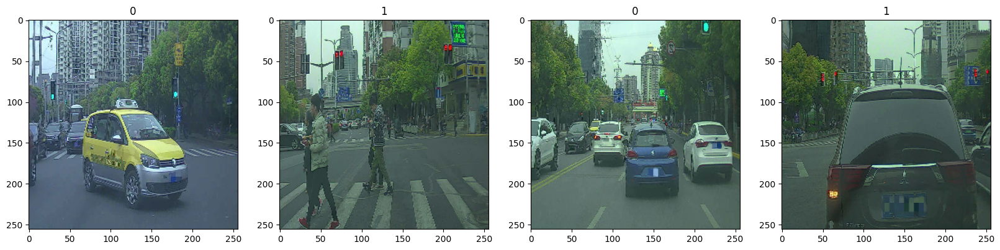

In [ ]:
# Visualizing the first 4 images and their corresponding labels of the first batch.

fig, ax = plt.subplots(ncols=4, figsize=(20,20))
for idx, img in enumerate(batch[0][:4]):
  ax[idx].imshow(img.astype(int))
  ax[idx].title.set_text(batch[1][idx])

# **2. Preprocess Data**

## **Scale Data**

In [ ]:
# Minimum and Maximum pixel value of the images.

print("Minimum value before scaling: ", batch[0].min())
print("Maximum value before scaling: ", batch[0].max())

Minimum value before scaling:  0.0
Maximum value before scaling:  255.0


In [ ]:
# Scaling the pixel values between [0, 1]

data = data.map(lambda x, y : (x/255, y))

data_iterator = data.as_numpy_iterator()
batch = data_iterator.next()
print("Minimum value after scaling: ", batch[0].min())
print("Maximum value after scaling: ", batch[0].max())

Minimum value after scaling:  0.0
Maximum value after scaling:  1.0


## **Split Data**

In [ ]:
# Total number of batches

len(data)

7

In [ ]:
# Deciding the no of batches for training, validation and testing

train_size = int(len(data) * .7) + 1
val_size = int(len(data) * .2)
test_size = int(len(data) * .1) + 1

print(train_size)
print(val_size)
print(test_size)

5
1
1


In [ ]:
# Spliting the data into training, validation and testing

train_data = data.take(train_size)
val_data = data.skip(train_size).take(val_size)
test_data = data.skip(train_size + val_size).take(test_size)

## **Augmentation of train data**

In [ ]:
def augment_image(image, label):

    # Apply data augmentation such as random flip horizontally
    image = tf.image.random_flip_left_right(image)

    return image, label

In [ ]:
# Apply data augmentation to the training dataset
train_data = train_data.map(augment_image)

# **3. CNN Model**

## **Building the Model**

In [ ]:
from keras import layers
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout

In [ ]:
model = Sequential()

In [ ]:
model.add(Conv2D(16, (3,3), 1, activation='relu', input_shape=(256, 256, 3)))
model.add(MaxPooling2D())

model.add(Conv2D(32, (3,3), 1, activation='relu'))
model.add(MaxPooling2D())

model.add(Conv2D(16, (3,3), 1, activation='relu'))
model.add(MaxPooling2D())

model.add(Flatten())

model.add(Dense(256, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

In [ ]:
model.compile('adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_15 (Conv2D)          (None, 254, 254, 16)      448       
                                                                 
 max_pooling2d_15 (MaxPooli  (None, 127, 127, 16)      0         
 ng2D)                                                           
                                                                 
 conv2d_16 (Conv2D)          (None, 125, 125, 32)      4640      
                                                                 
 max_pooling2d_16 (MaxPooli  (None, 62, 62, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_17 (Conv2D)          (None, 60, 60, 16)        4624      
                                                                 
 max_pooling2d_17 (MaxPooli  (None, 30, 30, 16)       

## **Train**

In [ ]:
History = model.fit(train_data, epochs = 20, validation_data=val_data)

Epoch 1/20
5/5 [==============================] - 4s 403ms/step - loss: 0.8063 - accuracy: 0.5063 - val_loss: 0.6963 - val_accuracy: 0.5000
Epoch 2/20
5/5 [==============================] - 2s 270ms/step - loss: 0.6976 - accuracy: 0.4750 - val_loss: 0.6824 - val_accuracy: 0.5312
Epoch 3/20
5/5 [==============================] - 2s 270ms/step - loss: 0.6589 - accuracy: 0.6687 - val_loss: 0.5526 - val_accuracy: 0.7188
Epoch 4/20
5/5 [==============================] - 2s 318ms/step - loss: 0.6541 - accuracy: 0.6187 - val_loss: 0.6625 - val_accuracy: 0.5312
Epoch 5/20
5/5 [==============================] - 5s 725ms/step - loss: 0.6465 - accuracy: 0.6062 - val_loss: 0.5947 - val_accuracy: 0.7812
Epoch 6/20
5/5 [==============================] - 2s 256ms/step - loss: 0.5738 - accuracy: 0.6938 - val_loss: 0.5691 - val_accuracy: 0.8125
Epoch 7/20
5/5 [==============================] - 2s 256ms/step - loss: 0.5356 - accuracy: 0.7250 - val_loss: 0.5573 - val_accuracy: 0.6875
Epoch 8/20
5/5 [====

## **Plot Performance**

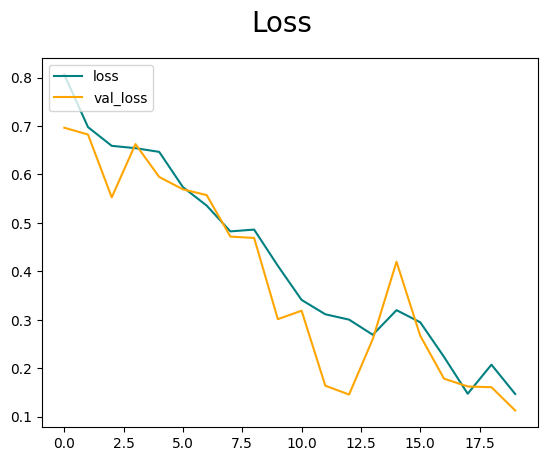

In [ ]:
fig = plt.figure()
plt.plot(History.history['loss'], color='teal', label='loss')
plt.plot(History.history['val_loss'], color='orange', label='val_loss')
fig.suptitle('Loss', fontsize=20)
plt.legend(loc='upper left')
plt.show()

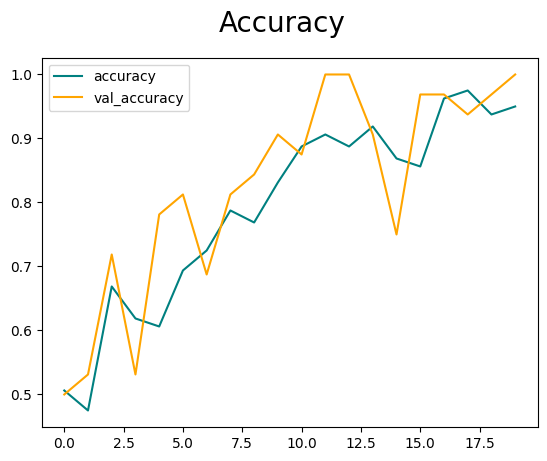

In [ ]:
fig = plt.figure()
plt.plot(History.history['accuracy'], color='teal', label='accuracy')
plt.plot(History.history['val_accuracy'], color='orange', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=20)
plt.legend(loc='upper left')
plt.show()

#**4. Evaluating Performance**

1/1 [==============================] - 0s 76ms/step


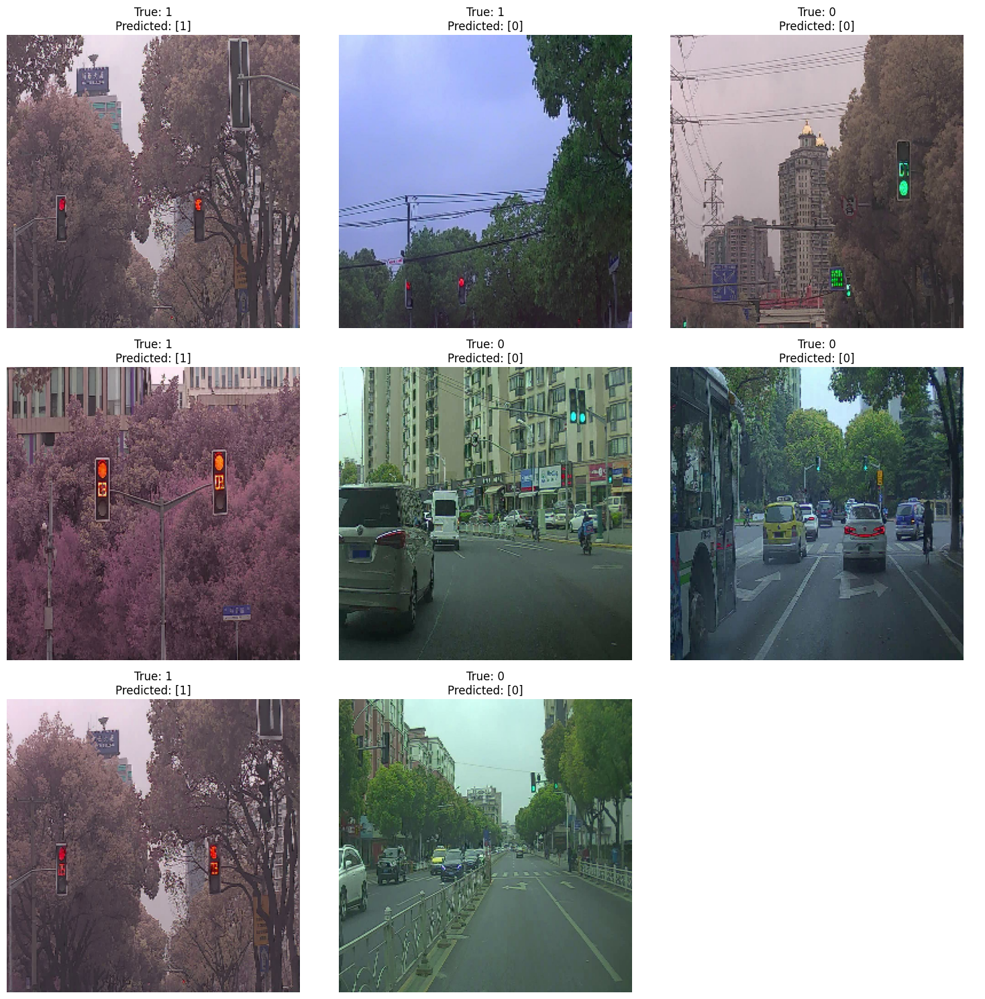

In [ ]:
from sklearn.metrics import roc_curve, auc, accuracy_score, classification_report, confusion_matrix, precision_recall_fscore_support

# Initialize lists to store true and predicted labels
true_labels = []
predicted_probs = []

# Iterate over test data and make predictions
for batch in test_data.as_numpy_iterator():
    X, y = batch
    yhat = model.predict(X)

    # Convert predictions to probabilities
    predicted_probs.extend(yhat)

    # Extend the true labels list
    true_labels.extend(y.astype(int))

# Convert predicted probabilities to class labels (assuming binary classification)
predicted_labels = (np.array(predicted_probs) > 0.5).astype(int)

# Display images in subplots
num_images = len(true_labels)
num_rows = int(np.ceil(num_images / 3))  # Adjust the number of columns as needed

fig, axes = plt.subplots(num_rows, 3, figsize=(15, 5 * num_rows))

# Display each test image along with its predicted value
for i in range(num_images):
    # Access the ith image and its true label
    image = X[i]
    true_label = true_labels[i]
    predicted_label = predicted_labels[i]

    # Determine the subplot position
    row = i // 3
    col = i % 3

    # Display the image
    axes[row, col].imshow(image)
    axes[row, col].set_title(f'True: {true_label}\nPredicted: {predicted_label}')
    axes[row, col].axis('off')

# Hide any remaining empty subplots
for i in range(num_images, num_rows * 3):
    row = i // 3
    col = i % 3
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
cm = confusion_matrix(true_labels, predicted_labels)
print(f'Confusion Matrix: \n {cm} \n')

# Classification Report
class_report = classification_report(true_labels, predicted_labels)
print(f'Classification Report:\n{class_report}')

# Compute precision, recall, and F1 score
precision, recall, f1_score, _ = precision_recall_fscore_support(true_labels, predicted_labels, average='binary')

# ROC Curve and AUC
fpr, tpr, thresholds = roc_curve(true_labels, predicted_labels)
roc_auc = auc(fpr, tpr)
print(f'ROC AUC: {roc_auc:.3f}')

print(f'Precision: {precision:.3f} \nRecall: {recall:.3f} \nF1-Score: {f1_score:.3f}')

# Accuracy Score
accuracy = accuracy_score(true_labels, predicted_labels)
print(f'Accuracy: {accuracy:.3f}')

Confusion Matrix: 
 [[4 0]
 [1 3]] 

Classification Report:
              precision    recall  f1-score   support

           0       0.80      1.00      0.89         4
           1       1.00      0.75      0.86         4

    accuracy                           0.88         8
   macro avg       0.90      0.88      0.87         8
weighted avg       0.90      0.88      0.87         8

ROC AUC: 0.875
Precision: 1.000 
Recall: 0.750 
F1-Score: 0.857
Accuracy: 0.875


<Axes: >

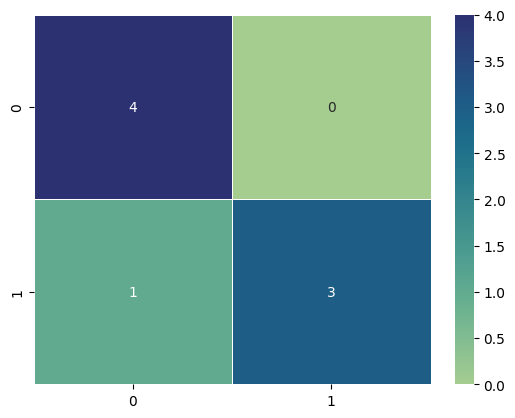

In [ ]:
import seaborn as sns
sns.heatmap(cm, annot=True, fmt='d', linewidth=.5, cmap="crest")

# **5. Testing with traffic light images**

## **Testing image-1**

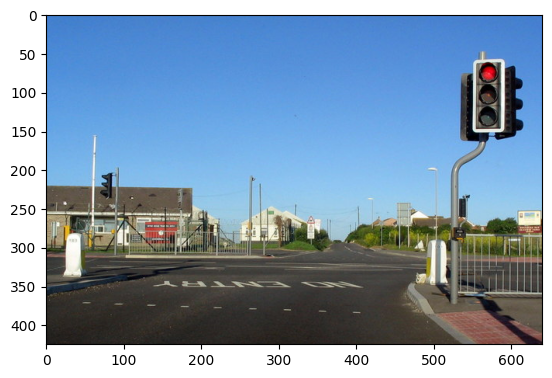

In [ ]:
import cv2

image1 = cv2.imread('/content/red_test1.jpg')
plt.imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
resized_1 = tf.image.resize(image1, (256, 256))

yhat = model.predict(np.expand_dims(resized_1/255, 0))
print(yhat)
print()

if yhat > 0.5:
  print('Predicted class is Red')
else:
  print('Predicted class is Green')

1/1 [==============================] - 0s 20ms/step
[[1.]]

Predicted class is Red


## **Testing image-2**

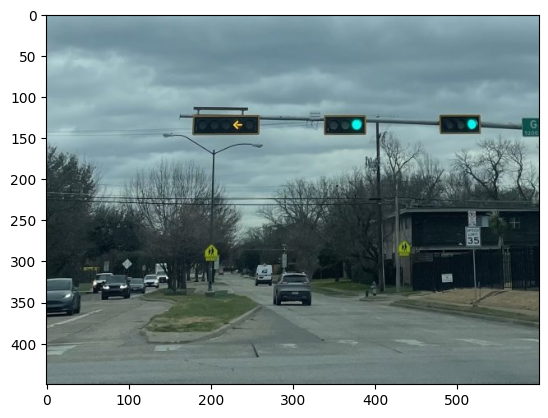

In [ ]:
image2 = cv2.imread('/content/green_test1.jpg')
plt.imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
resized_2 = tf.image.resize(image2, (256, 256))

yhat = model.predict(np.expand_dims(resized_2/255, 0))
print(yhat)
print()

if yhat > 0.5:
  print('Predicted class is Red')
else:
  print('Predicted class is Green')

1/1 [==============================] - 0s 20ms/step
[[0.00615904]]

Predicted class is Green


## **Testing image-3**

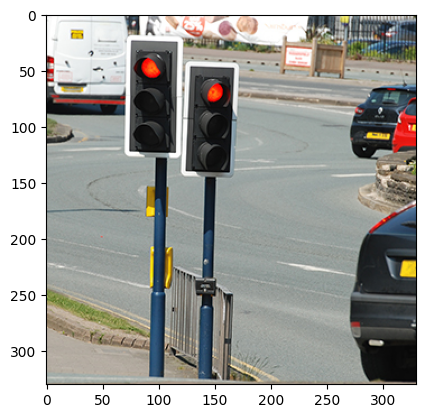

In [ ]:
image3 = cv2.imread('/content/red_test2.jpg')
plt.imshow(cv2.cvtColor(image3, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
resized_3 = tf.image.resize(image3, (256, 256))

yhat = model.predict(np.expand_dims(resized_3/255, 0))
print(yhat)
print()

if yhat > 0.5:
  print('Predicted class is Red')
else:
  print('Predicted class is Green')

1/1 [==============================] - 0s 20ms/step
[[0.1897628]]

Predicted class is Green


## **Testing image-4**

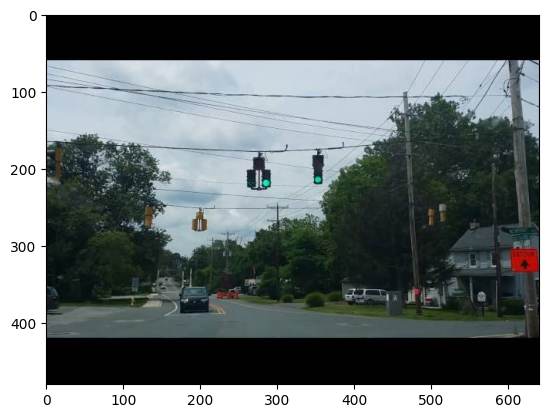

In [ ]:
image4 = cv2.imread('/content/green_test2.jpg')
plt.imshow(cv2.cvtColor(image4, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
resized_4 = tf.image.resize(image4, (256, 256))

yhat = model.predict(np.expand_dims(resized_4/255, 0))
print(yhat)
print()

if yhat > 0.5:
  print('Predicted class is Red')
else:
  print('Predicted class is Green')

1/1 [==============================] - 0s 26ms/step
[[0.07291652]]

Predicted class is Green


## **Testing image-5**

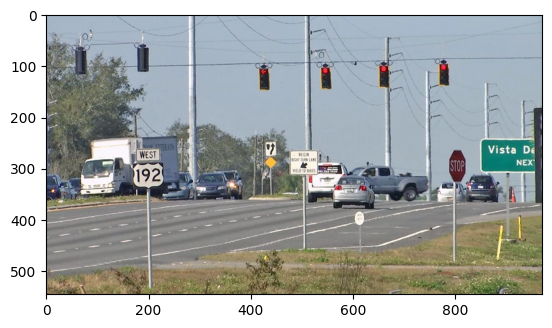

In [ ]:
image5 = cv2.imread('/content/red_test3.jpeg')
plt.imshow(cv2.cvtColor(image5, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
resized_5 = tf.image.resize(image5, (256, 256))

yhat = model.predict(np.expand_dims(resized_5/255, 0))
print(yhat)
print()

if yhat > 0.5:
  print('Predicted class is Red')
else:
  print('Predicted class is Green')

1/1 [==============================] - 0s 18ms/step
[[0.24886955]]

Predicted class is Green


## **Testing image-6**

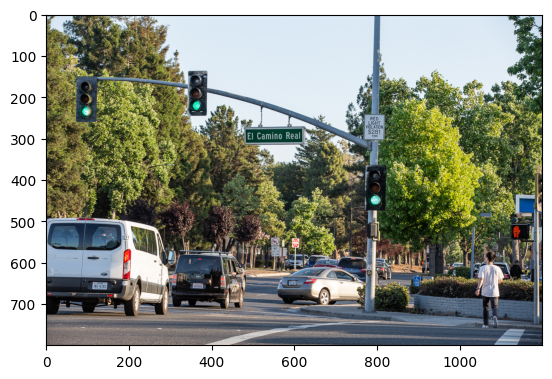

In [ ]:
image6 = cv2.imread('/content/green_test3.jpg')
plt.imshow(cv2.cvtColor(image6, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
resized_6 = tf.image.resize(image6, (256, 256))

yhat = model.predict(np.expand_dims(resized_6/255, 0))
print(yhat)
print()

if yhat > 0.5:
  print('Predicted class is Red')
else:
  print('Predicted class is Green')

1/1 [==============================] - 0s 19ms/step
[[3.322106e-06]]

Predicted class is Green


# **Decreasing the batch size and increasing the epochs with early stopping to increase the performance**

In [ ]:
# Changing the batch size

data = tf.keras.utils.image_dataset_from_directory(data_dir, batch_size=16)

Found 200 files belonging to 2 classes.


In [ ]:
data_iterator = data.as_numpy_iterator()
batch = data_iterator.next()

In [ ]:
batch[0].shape

(16, 256, 256, 3)

In [ ]:
batch[1]

array([0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1], dtype=int32)

In [ ]:
data = data.map(lambda x, y : (x/255, y))

data_iterator = data.as_numpy_iterator()
batch = data_iterator.next()
print("Minimum value after scaling: ", batch[0].min())
print("Maximum value after scaling: ", batch[0].max())

Minimum value after scaling:  0.0
Maximum value after scaling:  1.0


In [ ]:
len(data)

13

In [ ]:
train_size = int(len(data) * .7) + 1
val_size = int(len(data) * .2)
test_size = int(len(data) * .1)

print(train_size)
print(val_size)
print(test_size)

10
2
1


In [ ]:
train_data = data.take(train_size)
val_data = data.skip(train_size).take(val_size)
test_data = data.skip(train_size + val_size).take(test_size)

print(len(train_data))
print(len(val_data))
print(len(test_data))

10
2
1


In [ ]:
train_data = train_data.map(augment_image)

In [ ]:
model = Sequential()
model.add(Conv2D(16, (3,3), 1, activation='relu', input_shape=(256, 256, 3)))
model.add(MaxPooling2D())

model.add(Conv2D(32, (3,3), 1, activation='relu'))
model.add(MaxPooling2D())

model.add(Conv2D(16, (3,3), 1, activation='relu'))
model.add(MaxPooling2D())

model.add(Flatten())

model.add(Dense(256, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

model.compile('adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_21 (Conv2D)          (None, 254, 254, 16)      448       
                                                                 
 max_pooling2d_21 (MaxPooli  (None, 127, 127, 16)      0         
 ng2D)                                                           
                                                                 
 conv2d_22 (Conv2D)          (None, 125, 125, 32)      4640      
                                                                 
 max_pooling2d_22 (MaxPooli  (None, 62, 62, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_23 (Conv2D)          (None, 60, 60, 16)        4624      
                                                                 
 max_pooling2d_23 (MaxPooli  (None, 30, 30, 16)       

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

# Early Stopping Callback
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

History = model.fit(train_data, epochs=50, validation_data=val_data, callbacks=[early_stopping])

Epoch 1/50
10/10 [==============================] - 4s 140ms/step - loss: 0.7637 - accuracy: 0.5188 - val_loss: 0.6309 - val_accuracy: 0.7188
Epoch 2/50
10/10 [==============================] - 2s 141ms/step - loss: 0.6235 - accuracy: 0.6250 - val_loss: 0.5540 - val_accuracy: 0.8125
Epoch 3/50
10/10 [==============================] - 2s 185ms/step - loss: 0.4903 - accuracy: 0.8125 - val_loss: 0.6292 - val_accuracy: 0.6875
Epoch 4/50
10/10 [==============================] - 2s 139ms/step - loss: 0.4077 - accuracy: 0.8188 - val_loss: 0.4589 - val_accuracy: 0.7500
Epoch 5/50
10/10 [==============================] - 2s 184ms/step - loss: 0.3400 - accuracy: 0.8687 - val_loss: 0.2022 - val_accuracy: 0.9375
Epoch 6/50
10/10 [==============================] - 4s 357ms/step - loss: 0.3494 - accuracy: 0.8562 - val_loss: 0.3744 - val_accuracy: 0.7812
Epoch 7/50
10/10 [==============================] - 2s 188ms/step - loss: 0.3103 - accuracy: 0.8562 - val_loss: 0.3266 - val_accuracy: 0.8438
Epoch 

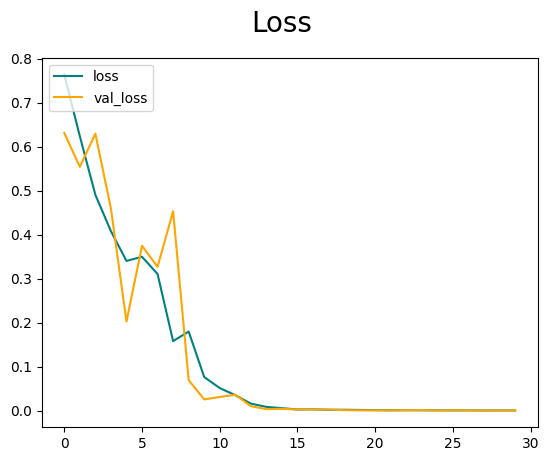

In [ ]:
fig = plt.figure()
plt.plot(History.history['loss'], color='teal', label='loss')
plt.plot(History.history['val_loss'], color='orange', label='val_loss')
fig.suptitle('Loss', fontsize=20)
plt.legend(loc='upper left')
plt.show()

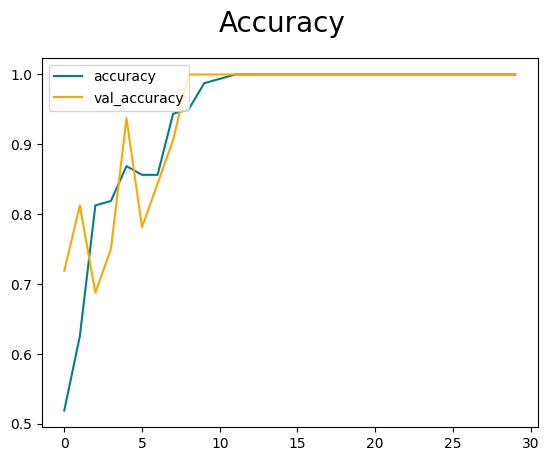

In [ ]:
fig = plt.figure()
plt.plot(History.history['accuracy'], color='teal', label='accuracy')
plt.plot(History.history['val_accuracy'], color='orange', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=20)
plt.legend(loc='upper left')
plt.show()

1/1 [==============================] - 0s 71ms/step


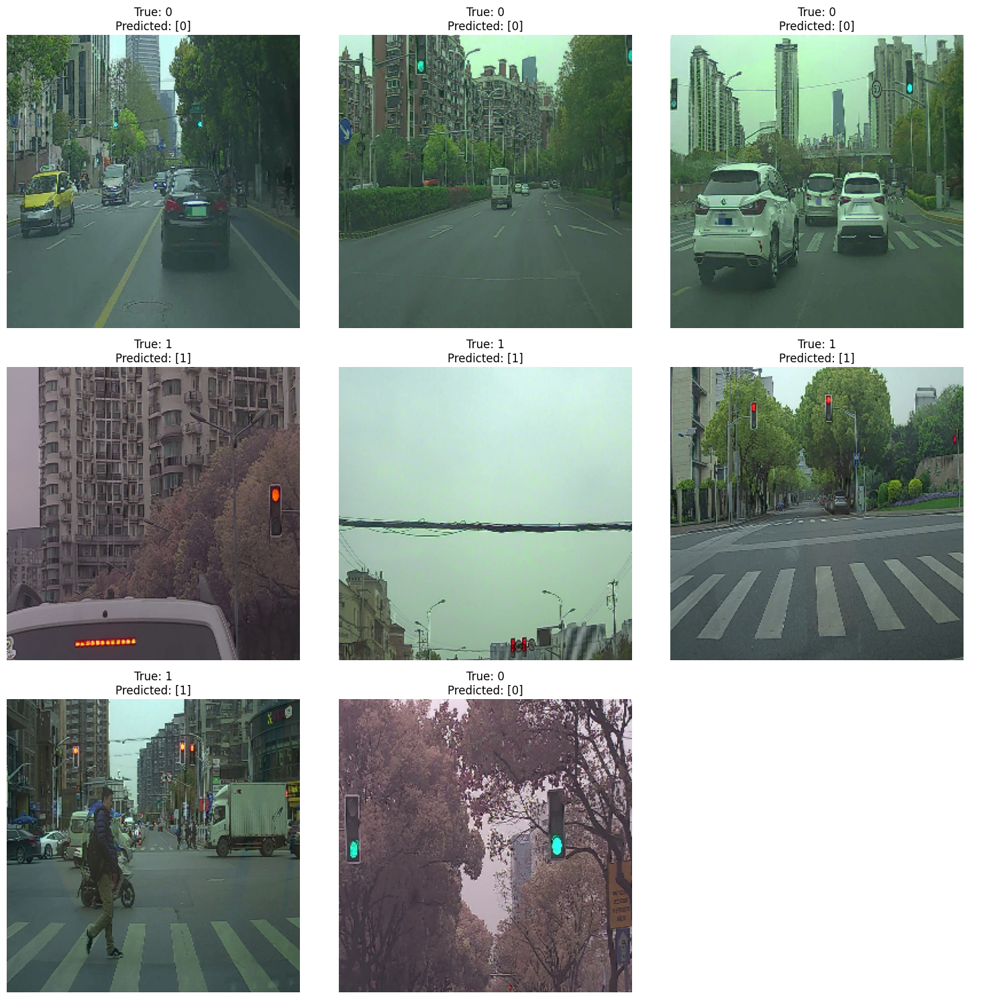

In [ ]:
from sklearn.metrics import roc_curve, auc, accuracy_score, classification_report, confusion_matrix, precision_recall_fscore_support

# Initialize lists to store true and predicted labels
true_labels = []
predicted_probs = []

# Iterate over test data and make predictions
for batch in test_data.as_numpy_iterator():
    X, y = batch
    yhat = model.predict(X)

    # Convert predictions to probabilities
    predicted_probs.extend(yhat)

    # Extend the true labels list
    true_labels.extend(y.astype(int))

# Convert predicted probabilities to class labels (assuming binary classification)
predicted_labels = (np.array(predicted_probs) > 0.5).astype(int)

# Display images in subplots
num_images = len(true_labels)
num_rows = int(np.ceil(num_images / 3))  # Adjust the number of columns as needed

fig, axes = plt.subplots(num_rows, 3, figsize=(15, 5 * num_rows))

# Display each test image along with its predicted value
for i in range(num_images):
    # Access the ith image and its true label
    image = X[i]
    true_label = true_labels[i]
    predicted_label = predicted_labels[i]

    # Determine the subplot position
    row = i // 3
    col = i % 3

    # Display the image
    axes[row, col].imshow(image)
    axes[row, col].set_title(f'True: {true_label}\nPredicted: {predicted_label}')
    axes[row, col].axis('off')

# Hide any remaining empty subplots
for i in range(num_images, num_rows * 3):
    row = i // 3
    col = i % 3
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
cm = confusion_matrix(true_labels, predicted_labels)
print(f'Confusion Matrix: \n {cm} \n')

# Classification Report
class_report = classification_report(true_labels, predicted_labels)
print(f'Classification Report:\n{class_report}')

# Compute precision, recall, and F1 score
precision, recall, f1_score, _ = precision_recall_fscore_support(true_labels, predicted_labels, average='binary')

# ROC Curve and AUC
fpr, tpr, thresholds = roc_curve(true_labels, predicted_labels)
roc_auc = auc(fpr, tpr)
print(f'ROC AUC: {roc_auc:.3f}')

print(f'Precision: {precision:.3f} \nRecall: {recall:.3f} \nF1-Score: {f1_score:.3f}')

# Accuracy Score
accuracy = accuracy_score(true_labels, predicted_labels)
print(f'Accuracy: {accuracy:.3f}')

Confusion Matrix: 
 [[4 0]
 [0 4]] 

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         4
           1       1.00      1.00      1.00         4

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

ROC AUC: 1.000
Precision: 1.000 
Recall: 1.000 
F1-Score: 1.000
Accuracy: 1.000


<Axes: >

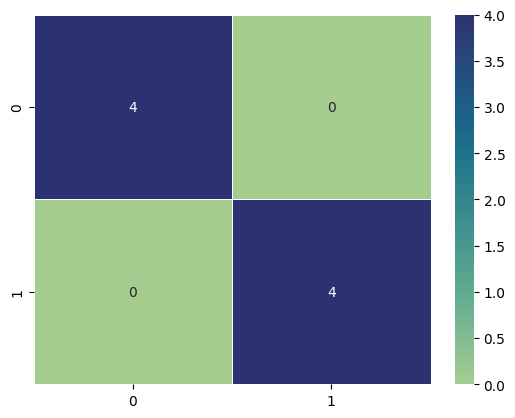

In [ ]:
sns.heatmap(cm, annot=True, fmt='d', linewidth=.5, cmap="crest")

## **Testing image-1**

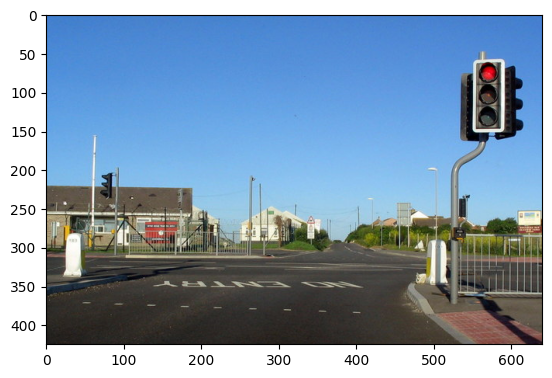

In [ ]:
import cv2

image1 = cv2.imread('/content/red_test1.jpg')
plt.imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
resize = tf.image.resize(image1, (256, 256))

yhat = model.predict(np.expand_dims(resize/255, 0))
print(yhat)
print()

if yhat > 0.5:
  print('Predicted class is Red')
else:
  print('Predicted class is Green')

1/1 [==============================] - 0s 17ms/step
[[1.]]

Predicted class is Red


## **Testing image-2**

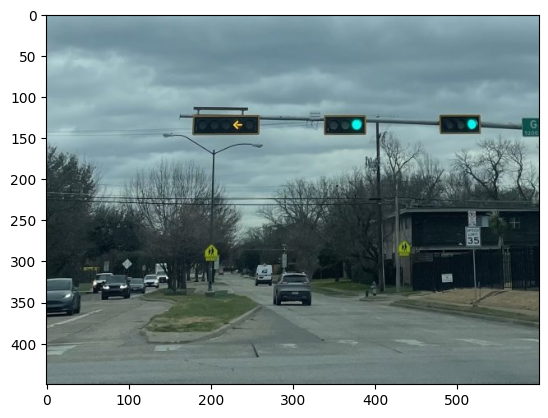

In [ ]:
image2 = cv2.imread('/content/green_test1.jpg')
plt.imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
resize = tf.image.resize(image2, (256, 256))

yhat = model.predict(np.expand_dims(resize/255, 0))
print(yhat)
print()

if yhat > 0.5:
  print('Predicted class is Red')
else:
  print('Predicted class is Green')

1/1 [==============================] - 0s 17ms/step
[[4.1645562e-05]]

Predicted class is Green


## **Testing image-3**

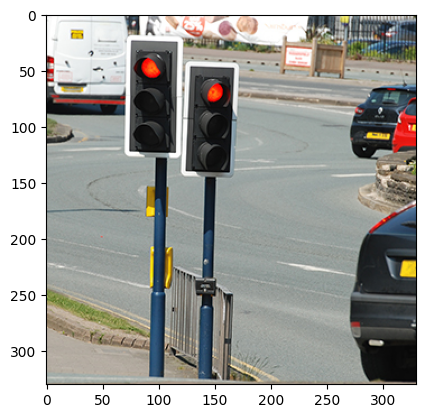

In [ ]:
image3 = cv2.imread('/content/red_test2.jpg')
plt.imshow(cv2.cvtColor(image3, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
resize = tf.image.resize(image3, (256, 256))

yhat = model.predict(np.expand_dims(resize/255, 0))
print(yhat)
print()

if yhat > 0.5:
  print('Predicted class is Red')
else:
  print('Predicted class is Green')

1/1 [==============================] - 0s 24ms/step
[[0.9999993]]

Predicted class is Red


## **Testing image-4**

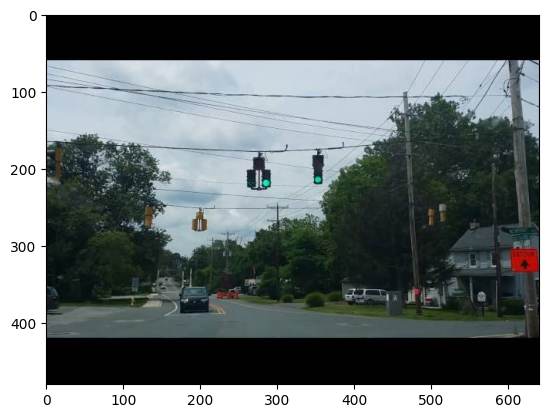

In [ ]:
image4 = cv2.imread('/content/green_test2.jpg')
plt.imshow(cv2.cvtColor(image4, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
resize = tf.image.resize(image4, (256, 256))

yhat = model.predict(np.expand_dims(resize/255, 0))
print(yhat)
print()

if yhat > 0.5:
  print('Predicted class is Red')
else:
  print('Predicted class is Green')

1/1 [==============================] - 0s 20ms/step
[[0.0009644]]

Predicted class is Green


## **Testing image-5**

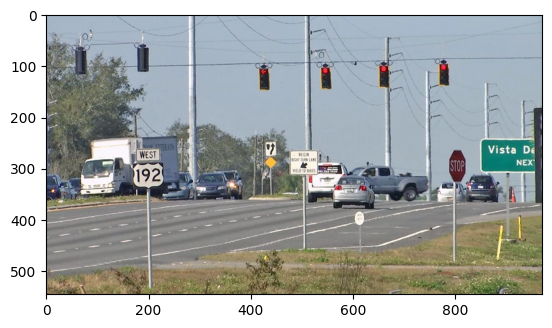

In [ ]:
image5 = cv2.imread('/content/red_test3.jpeg')
plt.imshow(cv2.cvtColor(image5, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
resize = tf.image.resize(image5, (256, 256))

yhat = model.predict(np.expand_dims(resize/255, 0))
print(yhat)
print()

if yhat > 0.5:
  print('Predicted class is Red')
else:
  print('Predicted class is Green')

1/1 [==============================] - 0s 19ms/step
[[0.8841285]]

Predicted class is Red


## **Testing image-6**

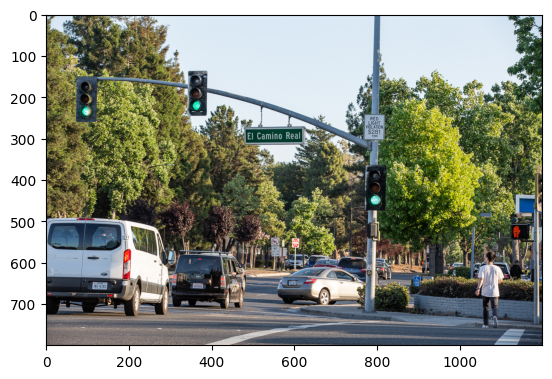

In [ ]:
image6 = cv2.imread('/content/green_test3.jpg')
plt.imshow(cv2.cvtColor(image6, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
resize = tf.image.resize(image6, (256, 256))

yhat = model.predict(np.expand_dims(resize/255, 0))
print(yhat)
print()

if yhat > 0.5:
  print('Predicted class is Red')
else:
  print('Predicted class is Green')

1/1 [==============================] - 0s 26ms/step
[[6.2701916e-13]]

Predicted class is Green


#  **Transfer Learning with (VGG16-Model)**

In [ ]:
from keras.applications import VGG16
import keras
from keras import layers
conv_base = VGG16(weights='imagenet', include_top=False, input_shape=(256, 256, 3))

In [ ]:
for layer in conv_base.layers:
    layer.trainable = False
model_vgg = Sequential([
    conv_base,
    Flatten(),
    Dense(32, activation='relu'),
    Dense(1, activation = "sigmoid")
])

model_vgg.compile(optimizer ='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
model_vgg.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 8, 8, 512)         14714688  
                                                                 
 flatten_4 (Flatten)         (None, 32768)             0         
                                                                 
 dense_8 (Dense)             (None, 32)                1048608   
                                                                 
 dense_9 (Dense)             (None, 1)                 33        
                                                                 
Total params: 15763329 (60.13 MB)
Trainable params: 1048641 (4.00 MB)
Non-trainable params: 14714688 (56.13 MB)
_________________________________________________________________


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

# Early Stopping Callback
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

History = model_vgg.fit(train_data, epochs=50, validation_data=val_data, callbacks=[early_stopping])

Epoch 1/50
10/10 [==============================] - 6s 427ms/step - loss: 1.3584 - accuracy: 0.4688 - val_loss: 0.6613 - val_accuracy: 0.4375
Epoch 2/50
10/10 [==============================] - 3s 244ms/step - loss: 0.6322 - accuracy: 0.5063 - val_loss: 0.6376 - val_accuracy: 0.5312
Epoch 3/50
10/10 [==============================] - 3s 210ms/step - loss: 0.6017 - accuracy: 0.7000 - val_loss: 0.6052 - val_accuracy: 0.7188
Epoch 4/50
10/10 [==============================] - 2s 202ms/step - loss: 0.6054 - accuracy: 0.6375 - val_loss: 0.6386 - val_accuracy: 0.6250
Epoch 5/50
10/10 [==============================] - 4s 384ms/step - loss: 0.5570 - accuracy: 0.7000 - val_loss: 0.3854 - val_accuracy: 0.8125
Epoch 6/50
10/10 [==============================] - 3s 212ms/step - loss: 0.4150 - accuracy: 0.7875 - val_loss: 0.3482 - val_accuracy: 0.8438
Epoch 7/50
10/10 [==============================] - 3s 203ms/step - loss: 0.3239 - accuracy: 0.8687 - val_loss: 0.2097 - val_accuracy: 0.9062
Epoch 

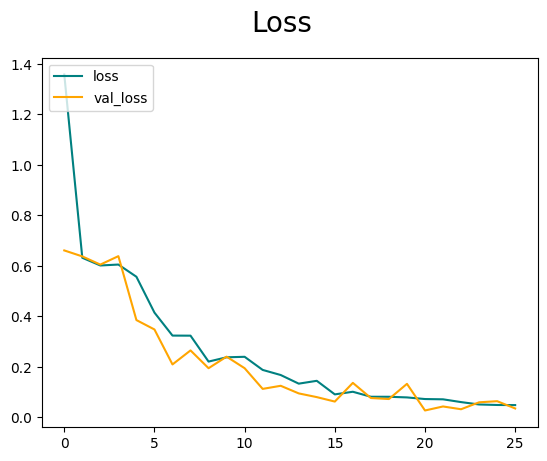

In [ ]:
fig = plt.figure()
plt.plot(History.history['loss'], color='teal', label='loss')
plt.plot(History.history['val_loss'], color='orange', label='val_loss')
fig.suptitle('Loss', fontsize=20)
plt.legend(loc='upper left')
plt.show()

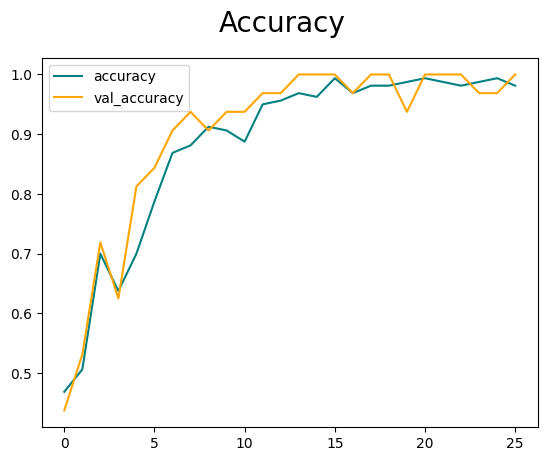

In [ ]:
fig = plt.figure()
plt.plot(History.history['accuracy'], color='teal', label='accuracy')
plt.plot(History.history['val_accuracy'], color='orange', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=20)
plt.legend(loc='upper left')
plt.show()

1/1 [==============================] - 0s 144ms/step


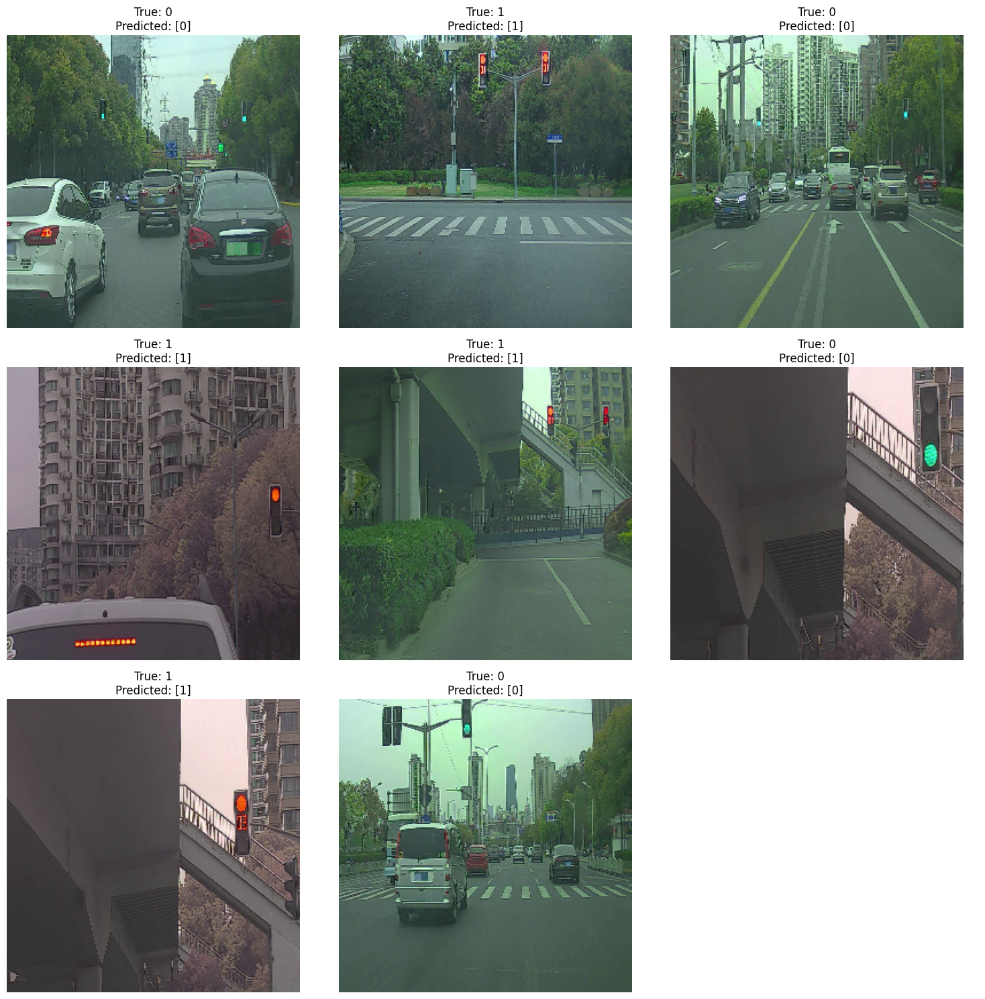

In [ ]:
from sklearn.metrics import roc_curve, auc, accuracy_score, classification_report, confusion_matrix, precision_recall_fscore_support

# Initialize lists to store true and predicted labels
true_labels = []
predicted_probs = []

# Iterate over test data and make predictions
for batch in test_data.as_numpy_iterator():
    X, y = batch
    yhat = model_vgg.predict(X)

    # Convert predictions to probabilities
    predicted_probs.extend(yhat)

    # Extend the true labels list
    true_labels.extend(y.astype(int))

# Convert predicted probabilities to class labels (assuming binary classification)
predicted_labels = (np.array(predicted_probs) > 0.5).astype(int)

# Display images in subplots
num_images = len(true_labels)
num_rows = int(np.ceil(num_images / 3))  # Adjust the number of columns as needed

fig, axes = plt.subplots(num_rows, 3, figsize=(15, 5 * num_rows))

# Display each test image along with its predicted value
for i in range(num_images):
    # Access the ith image and its true label
    image = X[i]
    true_label = true_labels[i]
    predicted_label = predicted_labels[i]

    # Determine the subplot position
    row = i // 3
    col = i % 3

    # Display the image
    axes[row, col].imshow(image)
    axes[row, col].set_title(f'True: {true_label}\nPredicted: {predicted_label}')
    axes[row, col].axis('off')

# Hide any remaining empty subplots
for i in range(num_images, num_rows * 3):
    row = i // 3
    col = i % 3
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
cm = confusion_matrix(true_labels, predicted_labels)
print(f'Confusion Matrix: \n {cm} \n')

# Classification Report
class_report = classification_report(true_labels, predicted_labels)
print(f'Classification Report:\n{class_report}')

# Compute precision, recall, and F1 score
precision, recall, f1_score, _ = precision_recall_fscore_support(true_labels, predicted_labels, average='binary')

# ROC Curve and AUC
fpr, tpr, thresholds = roc_curve(true_labels, predicted_labels)
roc_auc = auc(fpr, tpr)
print(f'ROC AUC: {roc_auc}')

print(f'Precision:{precision} \nRecall:{recall} \nF1-Score: {f1_score}')

# Accuracy Score
accuracy = accuracy_score(true_labels, predicted_labels)
print(f'Accuracy: {accuracy}')

Confusion Matrix: 
 [[4 0]
 [0 4]] 

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         4
           1       1.00      1.00      1.00         4

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

ROC AUC: 1.0
Precision:1.0 
Recall:1.0 
F1-Score: 1.0
Accuracy: 1.0


<Axes: >

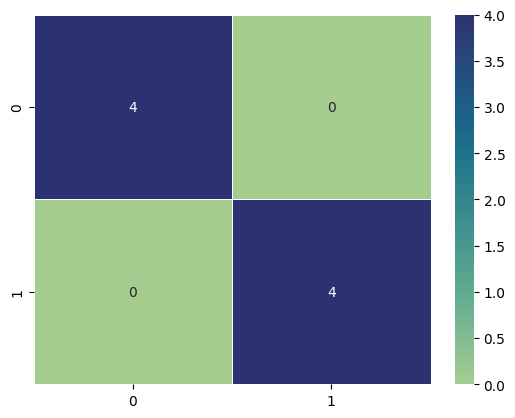

In [ ]:
import seaborn as sns
sns.heatmap(cm, annot=True, fmt='d', linewidth=.5, cmap="crest")

## **Testing Image-1**

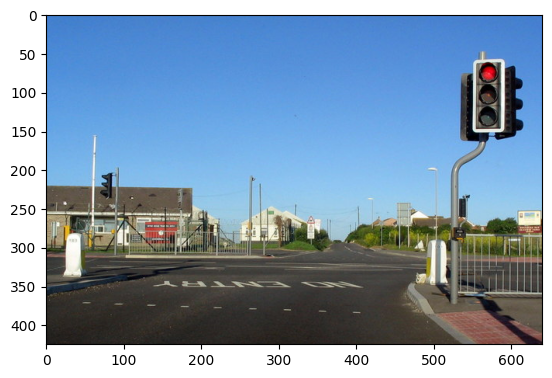

In [ ]:
import cv2
image1 = cv2.imread('/content/red_test1.jpg')
plt.imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
resize = tf.image.resize(image1, (256, 256))

yhat = model_vgg.predict(np.expand_dims(resize/255, 0))
print(yhat)
print()

if yhat > 0.5:
  print('Predicted class is Red')
else:
  print('Predicted class is Green')

1/1 [==============================] - 0s 27ms/step
[[0.6366783]]

Predicted class is Red


## **Testing Image-2**

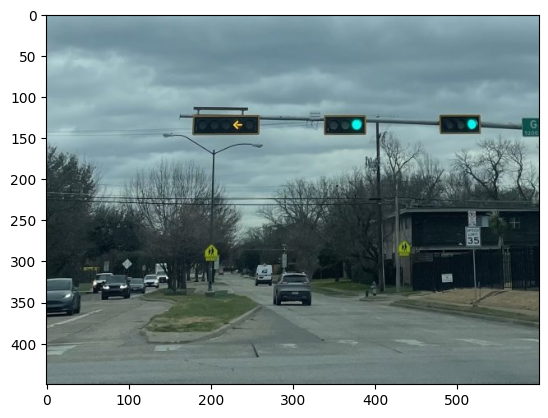

In [ ]:
image2 = cv2.imread('/content/green_test1.jpg')
plt.imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
resize = tf.image.resize(image2, (256, 256))

yhat = model_vgg.predict(np.expand_dims(resize/255, 0))
print(yhat)
print()

if yhat > 0.5:
  print('Predicted class is Red')
else:
  print('Predicted class is Green')

1/1 [==============================] - 0s 18ms/step
[[0.8228613]]

Predicted class is Red


## **Testing Image-3**

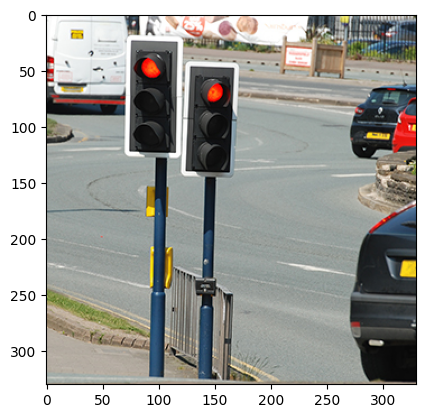

In [ ]:
image3 = cv2.imread('/content/red_test2.jpg')
plt.imshow(cv2.cvtColor(image3, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
resize = tf.image.resize(image3, (256, 256))

yhat = model_vgg.predict(np.expand_dims(resize/255, 0))
print(yhat)
print()

if yhat > 0.5:
  print('Predicted class is Red')
else:
  print('Predicted class is Green')

1/1 [==============================] - 0s 23ms/step
[[0.78479236]]

Predicted class is Red


## **Testing Image-4**

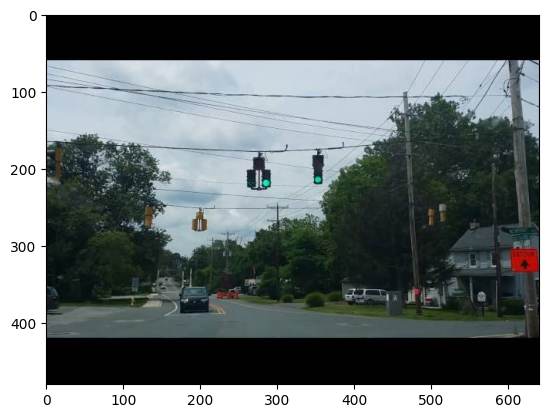

In [ ]:
image4 = cv2.imread('/content/green_test2.jpg')
plt.imshow(cv2.cvtColor(image4, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
resize = tf.image.resize(image4, (256, 256))

yhat = model_vgg.predict(np.expand_dims(resize/255, 0))
print(yhat)
print()

if yhat > 0.5:
  print('Predicted class is Red')
else:
  print('Predicted class is Green')

1/1 [==============================] - 0s 18ms/step
[[0.05569917]]

Predicted class is Green


## **Testing Image-5**

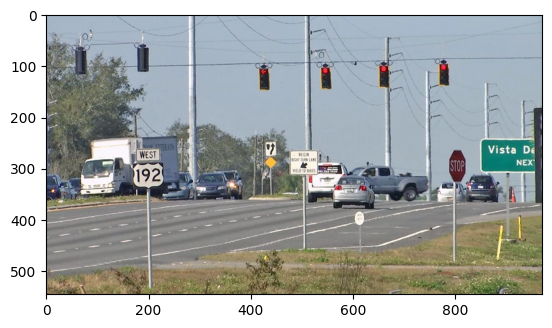

In [ ]:
image5 = cv2.imread('/content/red_test3.jpeg')
plt.imshow(cv2.cvtColor(image5, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
resize = tf.image.resize(image5, (256, 256))

yhat = model_vgg.predict(np.expand_dims(resize/255, 0))
print(yhat)
print()

if yhat > 0.5:
  print('Predicted class is Red')
else:
  print('Predicted class is Green')

1/1 [==============================] - 0s 19ms/step
[[0.07956914]]

Predicted class is Green


## **Testing Image-6**

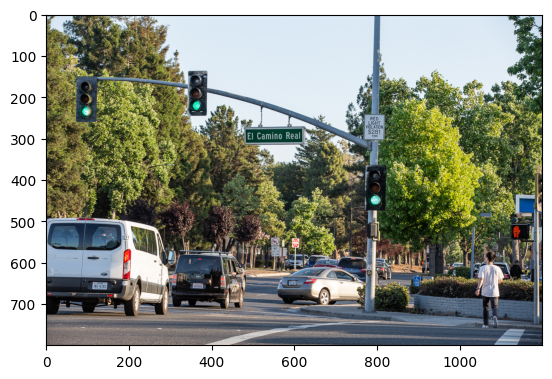

In [ ]:
image6 = cv2.imread('/content/green_test3.jpg')
plt.imshow(cv2.cvtColor(image6, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
resize = tf.image.resize(image6, (256, 256))

yhat = model_vgg.predict(np.expand_dims(resize/255, 0))
print(yhat)
print()

if yhat > 0.5:
  print('Predicted class is Red')
else:
  print('Predicted class is Green')

1/1 [==============================] - 0s 17ms/step
[[0.14818284]]

Predicted class is Green
